# Import Libraries

In [1]:
# DS Basics
import numpy as np
import pandas as pd
import pandas_profiling
import matplotlib.pyplot as plt
import seaborn as sns

# SKLearn Stuff

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score
from sklearn.tree import plot_tree
from sklearn.preprocessing import LabelEncoder

# helpers
%matplotlib inline

# Read Data Set Using Pandas

In [2]:
data = pd.read_csv('Demographic_Data_Clean.csv')
data.head()

,in-store,age,items,amount,region
0,0,37,4,281.03,2
1,0,35,2,219.51,2
2,1,45,3,1525.70,4
3,1,46,3,715.25,3
4,1,33,4,1937.50,1


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79976 entries, 0 to 79975
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   in-store  79976 non-null  int64  
 1   age       79976 non-null  int64  
 2   items     79976 non-null  int64  
 3   amount    79976 non-null  float64
 4   region    79976 non-null  int64  
dtypes: float64(1), int64(4)
memory usage: 3.1 MB


# Learning Some Functions We Will Use

In [4]:
#features
X = data.iloc[:,0:4]
print('Summary of feature sample')
X.head()

Summary of feature sample


,in-store,age,items,amount
0,0,37,4,281.03
1,0,35,2,219.51
2,1,45,3,1525.70
3,1,46,3,715.25
4,1,33,4,1937.50


In [5]:
# dependent variable
y = data['region']

In [6]:
# Train/Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .30, random_state = 123)

In [7]:
# Modeling (Classification)
algo = DecisionTreeClassifier(max_depth=4)
model = algo.fit(X_train,y_train)

In [8]:
# Predictions
preds = model.predict(X_test)

In [9]:
print(classification_report(y_test, preds))

              precision    recall  f1-score   support

           1       0.40      0.54      0.46      4828
           2       0.91      1.00      0.95      6030
           3       0.53      0.23      0.32      5357
           4       0.65      0.71      0.68      7778

    accuracy                           0.64     23993
   macro avg       0.62      0.62      0.60     23993
weighted avg       0.64      0.64      0.62     23993



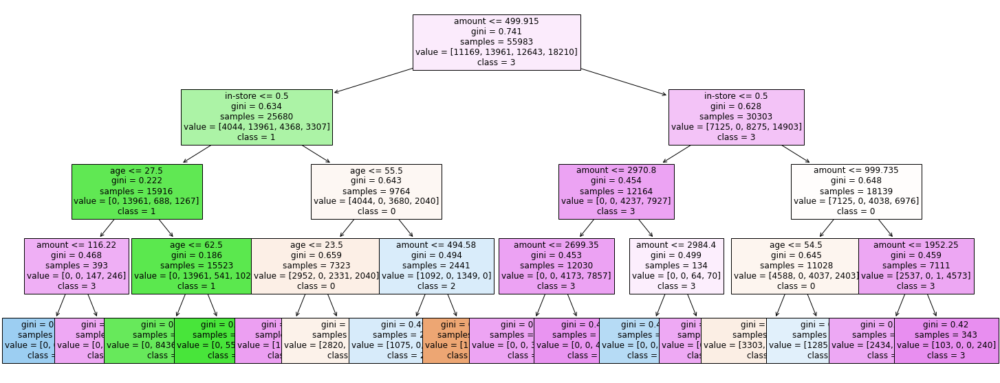

In [10]:
fig = plt.figure(figsize=(25,10))
tree = plot_tree(model, feature_names=X.columns,class_names=['0', '1', '2', '3'], filled=True, fontsize=12)

## Cross Validation Function

In [11]:
# Created a function that accomplishes cross validation without the superfluous output

def cv_func(X, y):
    algos_Class = []
    algos_Class.append(('DTC', DecisionTreeClassifier(max_depth=10)))
    algos_Class.append(('RFC', RandomForestClassifier(max_depth=10)))
    algos_Class.append(('GBC', GradientBoostingClassifier(max_depth=10)))
    results = []
    names = []
    for name, model in algos_Class:
        result = cross_val_score(model, X, y, cv=3, scoring='accuracy')
        names.append(name)
        results.append(result)
        print(name, result.mean())

In [12]:
cv_func(X, y)

DTC 0.637441252581289
RFC 0.6427928511853941
GBC 0.6232995044256633


# Preprocessing

In [13]:
# Algorithm iterations to save some keystrokes
dt = DecisionTreeClassifier()
dt3 = DecisionTreeClassifier(max_depth=3)
dt5 = DecisionTreeClassifier(max_depth=5)
dt10 = DecisionTreeClassifier(max_depth=10)

rf = RandomForestClassifier()
rf3 = RandomForestClassifier(max_depth=3)
rf5 = RandomForestClassifier(max_depth=5)
rf10 = RandomForestClassifier(max_depth=10)

gb = GradientBoostingClassifier()
gb3 = GradientBoostingClassifier(max_depth=3)
gb5 = GradientBoostingClassifier(max_depth=5)
gb10 = GradientBoostingClassifier(max_depth=10)

## Discretizing 'age' to use as the dependent variable

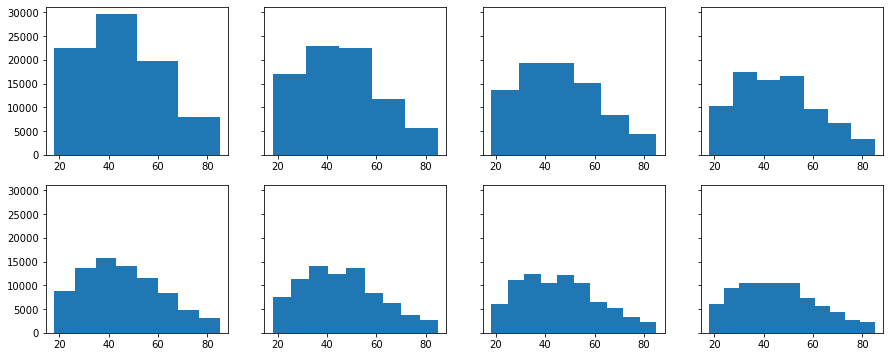

In [14]:
# Experiment with different bin sizes before discretizing 'age' feature
age_data = data['age']

fig, axs = plt.subplots(2, 4, figsize=(15,6), sharey=True)
axs[0,0].hist(age_data, bins=4)
axs[0,1].hist(age_data, bins=5)
axs[0,2].hist(age_data, bins=6)
axs[0,3].hist(age_data, bins=7)
axs[1,0].hist(age_data, bins=8)
axs[1,1].hist(age_data, bins=9)
axs[1,2].hist(age_data, bins=10)
axs[1,3].hist(age_data, bins=11)
plt.show()

(array([ 8859., 13586., 15742., 13973., 11568.,  8278.,  4881.,  3089.]),
 array([18.   , 26.375, 34.75 , 43.125, 51.5  , 59.875, 68.25 , 76.625,
        85.   ]),
 <BarContainer object of 8 artists>)

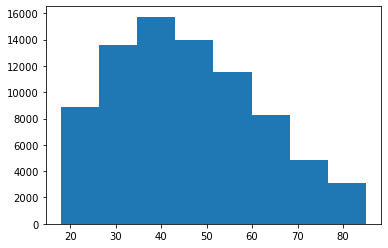

In [15]:
# Examining the breakdown of the bins and their values.
plt.hist(age_data, bins=8)

These examples all end up outputting float values. Since we are dealing with integers, I want bins with integer limits. Since Danielle wants to test Martin's hypothesis of "older customers spend more and shop instore more than younger customers," it may not be necessary to have so many bins, but we have to define what qualifies as "older". A simple way to start is to use common generational groupings. Doing so, we could use a breakdown as such:

Gen Z (b. 1997-2012): 25 and under

Millenial (b. 1981-1996): 26-41

Gen X (b. 1965-1980): 42-57

Baby Boomer (b. 1946-1964): 58-76

Silent Generation (b. 1925-1945): 77 and over

### Binning 'age' by Generation

In [16]:
# Use labels=False parameter to return an integer value.
data['age_gen'] = pd.cut(x=data['age'], bins=[18,25,41,57,76,85], labels=False, include_lowest=True)
data.head()

,in-store,age,items,amount,region,age_gen
0,0,37,4,281.03,2,1
1,0,35,2,219.51,2,1
2,1,45,3,1525.70,4,2
3,1,46,3,715.25,3,2
4,1,33,4,1937.50,1,1


In [17]:
data['age_gen'].value_counts()

1    27133
2    26683
3    15566
0     7505
4     3089
Name: age_gen, dtype: int64

This binning strategy yields rather lopsided groupings. Let's see how that affects our training.

In [18]:
# Finally getting an int64 type for the 'age' bins. 
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79976 entries, 0 to 79975
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   in-store  79976 non-null  int64  
 1   age       79976 non-null  int64  
 2   items     79976 non-null  int64  
 3   amount    79976 non-null  float64
 4   region    79976 non-null  int64  
 5   age_gen   79976 non-null  int64  
dtypes: float64(1), int64(5)
memory usage: 3.7 MB


In [19]:
# features
X = data.iloc[:, [0,2,3,4]]     # 'in-store', 'items', 'amount', 'region'
print('Summary of feature sample')
X.head()

Summary of feature sample


,in-store,items,amount,region
0,0,4,281.03,2
1,0,2,219.51,2
2,1,3,1525.70,4
3,1,3,715.25,3
4,1,4,1937.50,1


In [20]:
# dependent variable
y = data['age_gen']
y.head()

0    1
1    1
2    2
3    2
4    1
Name: age_gen, dtype: int64

In [21]:
# Train/Test Split
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.30, random_state = 2395)

In [22]:
# Modeling (Classification)
dtFit1 = dt3.fit(X_train, y_train)

In [23]:
#Predictions
dtPred1 = dtFit1.predict(X_test)

In [24]:
# Outputting the bin labels to make it immediately apparent how they are classified
print(classification_report(y_test, dtPred1, target_names=['Gen Z', 'Millenial', 'Gen X', 'Boomer', 'Silent Gen'], 
                            zero_division=0))

              precision    recall  f1-score   support

       Gen Z       0.00      0.00      0.00      2248
   Millenial       0.41      0.43      0.42      8136
       Gen X       0.34      0.38      0.36      8006
      Boomer       0.31      0.44      0.36      4709
  Silent Gen       0.00      0.00      0.00       894

    accuracy                           0.36     23993
   macro avg       0.21      0.25      0.23     23993
weighted avg       0.31      0.36      0.33     23993



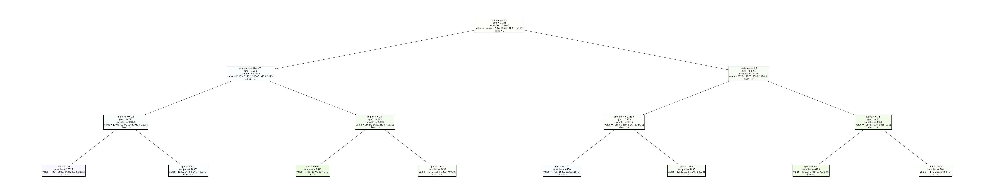

In [25]:
fig = plt.figure(figsize=(100,20))
tree = plot_tree(dtFit1, feature_names=X.columns, class_names = ['0', '1', '2', '3', '4'], filled=True, fontsize=12)

In [26]:
dtFit2 = dt5.fit(X_train, y_train)
dtPred2 = dtFit2.predict(X_test)
print(classification_report(y_test, dtPred2, target_names=['Gen Z', 'Millenial', 'Gen X', 'Boomer', 'Silent Gen'], 
                            zero_division=0))

              precision    recall  f1-score   support

       Gen Z       0.00      0.00      0.00      2248
   Millenial       0.39      0.57      0.47      8136
       Gen X       0.35      0.26      0.30      8006
      Boomer       0.33      0.44      0.38      4709
  Silent Gen       0.00      0.00      0.00       894

    accuracy                           0.37     23993
   macro avg       0.21      0.25      0.23     23993
weighted avg       0.32      0.37      0.33     23993



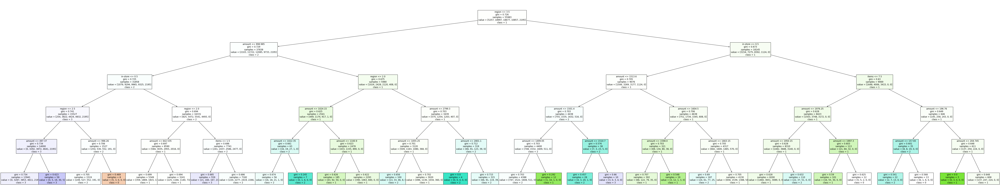

In [27]:
fig = plt.figure(figsize=(100,20))
tree = plot_tree(dtFit2, feature_names=X.columns, class_names = ['0', '1', '2', '3', '4'], filled=True, fontsize=12)

In [28]:
dtFit3 = dt10.fit(X_train, y_train)
dtPred3 = dtFit3.predict(X_test)
print(classification_report(y_test, dtPred3, target_names=['Gen Z', 'Millenial', 'Gen X', 'Boomer', 'Silent Gen'], 
                            zero_division=0))

              precision    recall  f1-score   support

       Gen Z       0.19      0.01      0.02      2248
   Millenial       0.39      0.50      0.44      8136
       Gen X       0.35      0.32      0.33      8006
      Boomer       0.33      0.43      0.37      4709
  Silent Gen       0.00      0.00      0.00       894

    accuracy                           0.36     23993
   macro avg       0.25      0.25      0.23     23993
weighted avg       0.33      0.36      0.34     23993



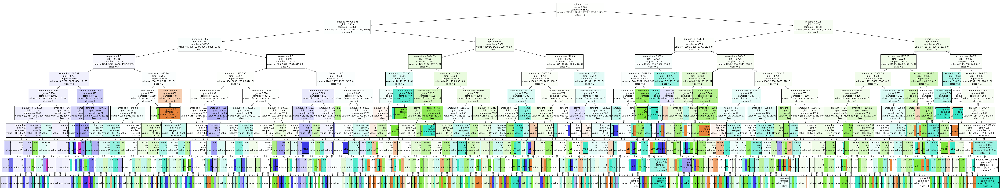

In [29]:
fig = plt.figure(figsize=(100,20))
tree = plot_tree(dtFit3, feature_names=X.columns, class_names = ['0', '1', '2', '3', '4'], filled=True, fontsize=12)

This decision tree is very busy and practically illegible. But we can see from the classification report that our training yielded a less than desirable model. Let us apply some other algorithms to see if we can glean any better information. 

In [30]:
# Additional Classification Algorithm: RandomForestClassifier
rfFit1 = rf3.fit(X_train, y_train)
rfPred1 = rfFit1.predict(X_test)
print(classification_report(y_test, rfPred1, target_names=['Gen Z', 'Millenial', 'Gen X', 'Boomer', 'Silent Gen'], 
                            zero_division=0))

              precision    recall  f1-score   support

       Gen Z       0.00      0.00      0.00      2248
   Millenial       0.39      0.64      0.48      8136
       Gen X       0.34      0.19      0.24      8006
      Boomer       0.33      0.42      0.37      4709
  Silent Gen       0.00      0.00      0.00       894

    accuracy                           0.37     23993
   macro avg       0.21      0.25      0.22     23993
weighted avg       0.31      0.37      0.32     23993



In [31]:
rfFit2 = rf5.fit(X_train, y_train)
rfPred2 = rfFit2.predict(X_test)
print(classification_report(y_test, rfPred2, target_names=['Gen Z', 'Millenial', 'Gen X', 'Boomer', 'Silent Gen'], 
                            zero_division=0))

              precision    recall  f1-score   support

       Gen Z       0.00      0.00      0.00      2248
   Millenial       0.39      0.58      0.47      8136
       Gen X       0.34      0.25      0.29      8006
      Boomer       0.33      0.43      0.37      4709
  Silent Gen       0.00      0.00      0.00       894

    accuracy                           0.37     23993
   macro avg       0.21      0.25      0.23     23993
weighted avg       0.31      0.37      0.33     23993



In [32]:
rfFit3 = rf10.fit(X_train, y_train)
rfPred3 = rfFit3.predict(X_test)
print(classification_report(y_test, rfPred3, target_names=['Gen Z', 'Millenial', 'Gen X', 'Boomer', 'Silent Gen'], 
                            zero_division=0))

              precision    recall  f1-score   support

       Gen Z       0.15      0.00      0.01      2248
   Millenial       0.38      0.53      0.45      8136
       Gen X       0.35      0.27      0.30      8006
      Boomer       0.33      0.45      0.38      4709
  Silent Gen       0.00      0.00      0.00       894

    accuracy                           0.36     23993
   macro avg       0.24      0.25      0.23     23993
weighted avg       0.33      0.36      0.33     23993



In [33]:
# Third Classification Algorithm: GradientBoostingClassifier
gbFit1 = gb3.fit(X_train, y_train)
gbPred1 = gbFit1.predict(X_test)
print(classification_report(y_test, gbPred1, target_names=['Gen Z', 'Millenial', 'Gen X', 'Boomer', 'Silent Gen']))

              precision    recall  f1-score   support

       Gen Z       0.10      0.00      0.00      2248
   Millenial       0.39      0.61      0.47      8136
       Gen X       0.34      0.23      0.27      8006
      Boomer       0.33      0.41      0.37      4709
  Silent Gen       0.23      0.01      0.01       894

    accuracy                           0.36     23993
   macro avg       0.28      0.25      0.23     23993
weighted avg       0.33      0.36      0.32     23993



In [34]:
gbFit2 = gb5.fit(X_train, y_train)
gbPred2 = gbFit2.predict(X_test)
print(classification_report(y_test, gbPred2, target_names=['Gen Z', 'Millenial', 'Gen X', 'Boomer', 'Silent Gen']))

              precision    recall  f1-score   support

       Gen Z       0.18      0.01      0.01      2248
   Millenial       0.39      0.57      0.46      8136
       Gen X       0.35      0.26      0.30      8006
      Boomer       0.33      0.42      0.37      4709
  Silent Gen       0.18      0.01      0.02       894

    accuracy                           0.36     23993
   macro avg       0.29      0.25      0.23     23993
weighted avg       0.34      0.36      0.33     23993



In [35]:
gbFit3 = gb10.fit(X_train, y_train)
gbPred3 = gbFit3.predict(X_test)
print(classification_report(y_test, gbPred3, target_names=['Gen Z', 'Millenial', 'Gen X', 'Boomer', 'Silent Gen']))

              precision    recall  f1-score   support

       Gen Z       0.16      0.03      0.06      2248
   Millenial       0.38      0.48      0.43      8136
       Gen X       0.34      0.32      0.33      8006
      Boomer       0.33      0.37      0.35      4709
  Silent Gen       0.16      0.05      0.08       894

    accuracy                           0.35     23993
   macro avg       0.27      0.25      0.25     23993
weighted avg       0.33      0.35      0.33     23993



In [36]:
# Cross Validation of each of the three algorithms
cv_func(X,y)

DTC 0.3596453770015486
RFC 0.35920775821968465
GBC 0.34666648801976213


The three algorithms tested produce similar models, though Gradient Boosting Classifier seems to have a little more success with smaller classes. Ultimately, binning 'age' by generations and using it as the dependent variable does not produce any reliable models. The larger classes tend to produce better results than the smaller ones. Let's try a different strategy: binning by decades.

### Binning 'age' by Decade

In [37]:
data['age_decade'] = pd.cut(x=data['age'], bins=[18,19,29,39,49,59,69,79,89], labels=False, include_lowest=True)
data.head()

,in-store,age,items,amount,region,age_gen,age_decade
0,0,37,4,281.03,2,1,2
1,0,35,2,219.51,2,1,2
2,1,45,3,1525.70,4,2,3
3,1,46,3,715.25,3,2,3
4,1,33,4,1937.50,1,1,2


In [38]:
data['age_decade'].value_counts()

2    17557
3    17518
4    15017
1    12670
5     9014
6     5196
7     2038
0      966
Name: age_decade, dtype: int64

We still see unbalanced groupings with this approach. Let's see if the results are as unbalanced as before.

In [39]:
# combine features and dependent variable cells with fresh train_test_split command cell to keep it all together
X = data.iloc[:, [0,2,3,4]]     # 'in-store', 'items', 'amount', 'region'
y = data['age_decade']
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.30, random_state = 2395)

In [40]:
dtFit6 = dt10.fit(X_train, y_train)
dtPred6 = dtFit6.predict(X_test)
print(classification_report(y_test, dtPred6, target_names=['Under 20', '20-29', '30-39', '40-49', '50-59', '60-69', '70-79',
                                                        'Over 80'], zero_division=0))

              precision    recall  f1-score   support

    Under 20       0.00      0.00      0.00       271
       20-29       0.24      0.25      0.24      3820
       30-39       0.22      0.27      0.24      5263
       40-49       0.24      0.29      0.26      5312
       50-59       0.21      0.15      0.17      4469
       60-69       0.18      0.25      0.21      2724
       70-79       0.12      0.01      0.03      1545
     Over 80       0.00      0.00      0.00       589

    accuracy                           0.22     23993
   macro avg       0.15      0.15      0.14     23993
weighted avg       0.21      0.22      0.21     23993



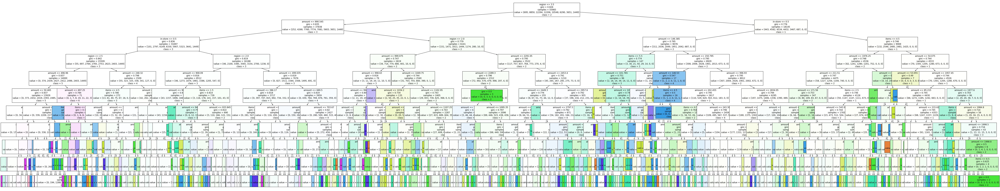

In [41]:
fig = plt.figure(figsize=(100,20))
tree = plot_tree(dtFit6, feature_names=X.columns, class_names = ['0', '1', '2', '3', '4', '5', '6', '7', '8'], 
                 filled=True, fontsize=12)

In [42]:
rfFit6 = rf10.fit(X_train, y_train)
rfPred6 = rfFit6.predict(X_test)
print(classification_report(y_test, rfPred6, target_names=['Under 20', '20-29', '30-39', '40-49', '50-59', '60-69', '70-79',
                                                        'Over 80'], zero_division=0))

              precision    recall  f1-score   support

    Under 20       0.00      0.00      0.00       271
       20-29       0.26      0.22      0.24      3820
       30-39       0.22      0.28      0.25      5263
       40-49       0.23      0.28      0.25      5312
       50-59       0.21      0.18      0.19      4469
       60-69       0.19      0.19      0.19      2724
       70-79       0.16      0.10      0.12      1545
     Over 80       0.00      0.00      0.00       589

    accuracy                           0.22     23993
   macro avg       0.16      0.16      0.16     23993
weighted avg       0.21      0.22      0.21     23993



In [43]:
gbFit6 = gb10.fit(X_train, y_train)
gbPred6 = gbFit6.predict(X_test)
print(classification_report(y_test, gbPred6, target_names=['Under 20', '20-29', '30-39', '40-49', '50-59', '60-69', '70-79',
                                                        'Over 80'], zero_division=0))

              precision    recall  f1-score   support

    Under 20       0.03      0.03      0.03       271
       20-29       0.24      0.22      0.23      3820
       30-39       0.23      0.28      0.25      5263
       40-49       0.23      0.28      0.25      5312
       50-59       0.21      0.18      0.19      4469
       60-69       0.19      0.16      0.17      2724
       70-79       0.15      0.12      0.13      1545
     Over 80       0.12      0.06      0.08       589

    accuracy                           0.22     23993
   macro avg       0.18      0.16      0.17     23993
weighted avg       0.21      0.22      0.21     23993



In [44]:
cv_func(X,y)

DTC 0.21792789547333968
RFC 0.21899073057928342
GBC 0.20992545597687604


The smaller groupings don't appear to be providing the model what it needs to get reliable results. It is also apparent that more categories leads to greater difficulty in getting accurate results. Let's try one more grouping that reduces the number of bins and balances out the bin sizes a bit to see if we can get better data to train on.

### Binning 'age' to Balance Group Sizes

The most active ages by sales are the middle-aged customers. We'll bin everyone under 30 together, then bin by decade until we reach 60 and above.

In [45]:
data['age_balgrp'] = pd.cut(x=data['age'], bins=[18,29,39,49,59,85], labels=False, include_lowest=True)
data.head()

,in-store,age,items,amount,region,age_gen,age_decade,age_balgrp
0,0,37,4,281.03,2,1,2,1
1,0,35,2,219.51,2,1,2,1
2,1,45,3,1525.70,4,2,3,2
3,1,46,3,715.25,3,2,3,2
4,1,33,4,1937.50,1,1,2,1


In [46]:
data['age_balgrp'].value_counts()

1    17557
2    17518
4    16248
3    15017
0    13636
Name: age_balgrp, dtype: int64

Bins are much more congruent using this strategy. Let's see if it translates into friendlier data for modeling.

In [47]:
X = data.iloc[:, [0,2,3,4]]     # 'in-store', 'items', 'amount', 'region'
y = data['age_balgrp']
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.30, random_state = 2395)

In [48]:
# For simplicity's sake, we'll use a single algorithm for training/testing going forward. 
# GradientBoostingClassifier with max_depth=10 seems to yield the best results thus far.
gbFit7 = gb10.fit(X_train, y_train)
gbPred7 = gbFit7.predict(X_test)
print(classification_report(y_test, gbPred7, target_names=['Under 30', '30s', '40s', '50s', '60 Plus'], zero_division=0))

              precision    recall  f1-score   support

    Under 30       0.26      0.31      0.28      4091
         30s       0.24      0.19      0.21      5263
         40s       0.24      0.20      0.22      5312
         50s       0.21      0.09      0.13      4469
     60 Plus       0.38      0.69      0.49      4858

    accuracy                           0.29     23993
   macro avg       0.27      0.30      0.27     23993
weighted avg       0.27      0.29      0.27     23993



In [49]:
cv_func(X,y)

DTC 0.3063294278393957
RFC 0.3061543493701922
GBC 0.2908497467310996


We still see some inadequacies in the model when we use discretized 'age' as the dependent variable, regardless of binning strategy. Perhaps we can have more success with an alternate variable as the target.

## Discretizing 'amount' to use as the dependent variable

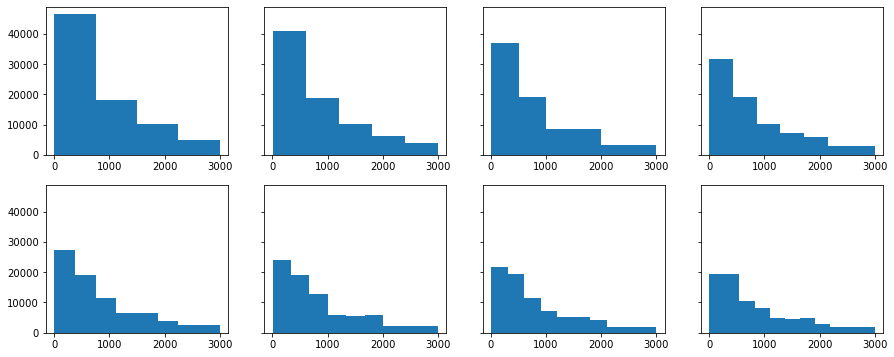

In [50]:
# Experiment with different bin sizes before discretizing 'amount' feature
amt_data = data['amount']

fig, axs = plt.subplots(2, 4, figsize=(15,6), sharey=True)
axs[0,0].hist(amt_data, bins=4)
axs[0,1].hist(amt_data, bins=5)
axs[0,2].hist(amt_data, bins=6)
axs[0,3].hist(amt_data, bins=7)
axs[1,0].hist(amt_data, bins=8)
axs[1,1].hist(amt_data, bins=9)
axs[1,2].hist(amt_data, bins=10)
axs[1,3].hist(amt_data, bins=11)
plt.show()

The vast majority of transactions are $500 or less, and there is a steady decline beyond that range.

### First Binning Attempt with 'amount'

In [51]:
data['amt_range_A'] = pd.cut(x=data['amount'], bins=[0.00,500.00,1500.00,3000.00], labels=False)
data.head()

,in-store,age,items,amount,region,age_gen,age_decade,age_balgrp,amt_range_A
0,0,37,4,281.03,2,1,2,1,0
1,0,35,2,219.51,2,1,2,1,0
2,1,45,3,1525.70,4,2,3,2,2
3,1,46,3,715.25,3,2,3,2,1
4,1,33,4,1937.50,1,1,2,1,2


In [52]:
data['amt_range_A'].value_counts()

0    36811
1    27772
2    15393
Name: amt_range_A, dtype: int64

In [53]:
# Including our discretized 'age_balgrp' values (under 30, 30s, 40s, 50s, 60 plus) in our features.
X = data.iloc[:, [0,2,4,7]]    # 'in-store', 'items', 'region', 'age_balgrp'
y = data['amt_range_A']
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.30, random_state = 2395)

In [54]:
gbFit8 = gb10.fit(X_train, y_train)
gbPred8 = gbFit8.predict(X_test)
print(classification_report(y_test, gbPred8, target_names=['$500 or less', '$500-$1500', 'Over $1500'], zero_division=0))

              precision    recall  f1-score   support

$500 or less       0.90      0.60      0.72     11134
  $500-$1500       0.52      0.66      0.58      8320
  Over $1500       0.50      0.65      0.57      4539

    accuracy                           0.63     23993
   macro avg       0.64      0.64      0.62     23993
weighted avg       0.69      0.63      0.64     23993



In [55]:
cv_func(X,y)

DTC 0.6371286026749345
RFC 0.6378163064855112
GBC 0.6374286987995207


With this strategy, we get a high success rate in predicting if a purchase is under `$500` but it is difficult to categorize purchases more than that.

### Refined Binning with 'amount'

In [56]:
data['amt_range_B'] = pd.cut(x=data['amount'], bins=[0.00,300.00,600.00,1200.00,3000.00], labels=False)
data.head()

,in-store,age,items,amount,region,age_gen,age_decade,age_balgrp,amt_range_A,amt_range_B
0,0,37,4,281.03,2,1,2,1,0,0
1,0,35,2,219.51,2,1,2,1,0,0
2,1,45,3,1525.70,4,2,3,2,2,3
3,1,46,3,715.25,3,2,3,2,1,2
4,1,33,4,1937.50,1,1,2,1,2,3


Here we try to find a balance between bins that give us similarly sized sets and dollar ranges that make sense to the average viewer.

In [57]:
data['amt_range_B'].value_counts()

0    21219
3    20583
1    19478
2    18696
Name: amt_range_B, dtype: int64

In [58]:
X = data.iloc[:, [0,2,4,7]]     # 'in-store', 'items', 'region', 'age_balgrp'
y = data['amt_range_B']
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.30, random_state = 2395)

In [59]:
gbFit9 = gb10.fit(X_train, y_train)
gbPred9 = gbFit9.predict(X_test)
print(classification_report(y_test, gbPred9, target_names=['$300 or less', '$300-$600', '$600-$1200', 
                                                         'Over $1200'], zero_division=0))

              precision    recall  f1-score   support

$300 or less       0.59      0.56      0.58      6361
   $300-$600       0.29      0.03      0.05      5931
  $600-$1200       0.39      0.52      0.45      5613
  Over $1200       0.53      0.86      0.65      6088

    accuracy                           0.50     23993
   macro avg       0.45      0.49      0.43     23993
weighted avg       0.46      0.50      0.44     23993



In [60]:
cv_func(X,y)

DTC 0.49878712269472875
RFC 0.49902469193368976
GBC 0.49878712269472875


That `$300-$600` range seems to throw a real kink in the model, and we're still not close to an acceptable overall accuracy.

### Binning 'amount' as a Binary

Let's see what happens if we reduce amount to two categories.

In [61]:
data['amt_range_C'] = pd.cut(x=data['amount'], bins=[0.00,500.00,3000.00], labels=False)
data.head()

,in-store,age,items,amount,region,age_gen,age_decade,age_balgrp,amt_range_A,amt_range_B,amt_range_C
0,0,37,4,281.03,2,1,2,1,0,0,0
1,0,35,2,219.51,2,1,2,1,0,0,0
2,1,45,3,1525.70,4,2,3,2,2,3,1
3,1,46,3,715.25,3,2,3,2,1,2,1
4,1,33,4,1937.50,1,1,2,1,2,3,1


In [62]:
data['amt_range_C'].value_counts()

1    43165
0    36811
Name: amt_range_C, dtype: int64

In [63]:
X = data.iloc[:, [0,2,4,7]]    # 'in-store', 'items', 'region', 'age_balgrp'
y = data['amt_range_C']
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.30, random_state = 2395)

In [64]:
gbFit10 = gb10.fit(X_train, y_train)
gbPred10 = gbFit10.predict(X_test)
print(classification_report(y_test, gbPred10, target_names=['$500 or less', 'Over $500'], zero_division=0))

              precision    recall  f1-score   support

$500 or less       0.91      0.60      0.72     11134
   Over $500       0.73      0.95      0.83     12859

    accuracy                           0.79     23993
   macro avg       0.82      0.77      0.77     23993
weighted avg       0.81      0.79      0.78     23993



In [65]:
cv_func(X,y)

DTC 0.7886990988789914
RFC 0.7885865599594185
GBC 0.7891617356382787


While we are able to get a more accurate model when we make the target variable binary, we glean less information from the result. Perhaps there are ways to get better information from one of our other discretized 'amounts'.

### Removing 'items' from the Tree

We concluded in the last task that number of items purchased had no significant correlation to the amount spent, so let's remove that from the tree and see if it has an effect.

In [66]:
X = data.iloc[:, [0,4,7]]     # 'in-store', 'region', 'age_balgrp'
y = data['amt_range_B']
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.30, random_state = 2395)

In [67]:
dtFit11 = dt10.fit(X_train, y_train)
dtPred11 = dtFit11.predict(X_test)
print(classification_report(y_test, dtPred11, target_names=['$500 or less', '$300-$600', '$600-$1200', 
                                                         'Over $500'], zero_division=0))

              precision    recall  f1-score   support

$500 or less       0.59      0.56      0.58      6361
   $300-$600       0.00      0.00      0.00      5931
  $600-$1200       0.39      0.56      0.46      5613
   Over $500       0.53      0.86      0.65      6088

    accuracy                           0.50     23993
   macro avg       0.38      0.50      0.42     23993
weighted avg       0.38      0.50      0.43     23993



In [68]:
rfFit11 = rf10.fit(X_train, y_train)
rfPred11 = rfFit11.predict(X_test)
print(classification_report(y_test, rfPred11, target_names=['$300 or less', '$300-$600', '$600-$1200', 
                                                         'Over $1200'], zero_division=0))

              precision    recall  f1-score   support

$300 or less       0.59      0.56      0.58      6361
   $300-$600       0.00      0.00      0.00      5931
  $600-$1200       0.39      0.56      0.46      5613
  Over $1200       0.53      0.86      0.65      6088

    accuracy                           0.50     23993
   macro avg       0.38      0.50      0.42     23993
weighted avg       0.38      0.50      0.43     23993



In [69]:
gbFit11 = gb10.fit(X_train, y_train)
gbPred11 = gbFit11.predict(X_test)
print(classification_report(y_test, gbPred11, target_names=['$300 or less', '$300-$600', '$600-$1200', 
                                                         'Over $1200'], zero_division=0))

              precision    recall  f1-score   support

$300 or less       0.59      0.56      0.58      6361
   $300-$600       0.00      0.00      0.00      5931
  $600-$1200       0.39      0.56      0.46      5613
  Over $1200       0.53      0.86      0.65      6088

    accuracy                           0.50     23993
   macro avg       0.38      0.50      0.42     23993
weighted avg       0.38      0.50      0.43     23993



In [70]:
cv_func(X,y)

DTC 0.5015504720192395
RFC 0.5015504720192395
GBC 0.5015504720192395


Interestingly, with 'items' removed, all three algorithms now return identical figures. I wonder if this could be due to having too few features in our model. Let's try putting 'items' back in and taking out 'in-store' to see if we get a similar result.

### Testing a Hypothesis: Is There a Lower Limit to the Number of Features Needed to Return Meaningful Results?

In [71]:
X = data.iloc[:, [2,4,7]]     # 'items', 'region', 'age_balgrp'
y = data['amt_range_B']
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.30, random_state = 2395)

In [72]:
dtFit12 = dt10.fit(X_train, y_train)
dtPred12 = dtFit12.predict(X_test)
print(classification_report(y_test, dtPred12, target_names=['$300 or less', '$300-$600', '$600-$1200', 
                                                         'Over $1200'], zero_division=0))

              precision    recall  f1-score   support

$300 or less       0.59      0.56      0.58      6361
   $300-$600       0.26      0.01      0.02      5931
  $600-$1200       0.36      0.57      0.44      5613
  Over $1200       0.49      0.71      0.58      6088

    accuracy                           0.46     23993
   macro avg       0.42      0.46      0.40     23993
weighted avg       0.43      0.46      0.41     23993



In [73]:
rfFit12 = rf10.fit(X_train, y_train)
rfPred12 = rfFit12.predict(X_test)
print(classification_report(y_test, rfPred12, target_names=['$300 or less', '$300-$600', '$600-$1200', 
                                                         'Over $1200'], zero_division=0))

              precision    recall  f1-score   support

$300 or less       0.59      0.56      0.58      6361
   $300-$600       0.28      0.00      0.01      5931
  $600-$1200       0.36      0.59      0.44      5613
  Over $1200       0.49      0.70      0.58      6088

    accuracy                           0.47     23993
   macro avg       0.43      0.46      0.40     23993
weighted avg       0.44      0.47      0.41     23993



In [74]:
gbFit12 = gb10.fit(X_train, y_train)
gbPred12 = gbFit12.predict(X_test)
print(classification_report(y_test, gbPred12, target_names=['$300 or less', '$300-$600', '$600-$1200', 
                                                         'Over $1200'], zero_division=0))

              precision    recall  f1-score   support

$300 or less       0.59      0.56      0.58      6361
   $300-$600       0.26      0.01      0.02      5931
  $600-$1200       0.36      0.57      0.44      5613
  Over $1200       0.49      0.71      0.58      6088

    accuracy                           0.46     23993
   macro avg       0.42      0.46      0.40     23993
weighted avg       0.43      0.46      0.41     23993



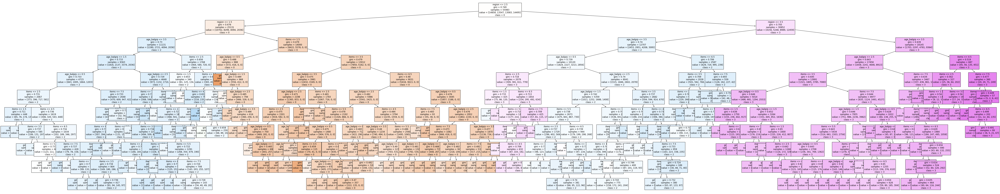

In [75]:
fig = plt.figure(figsize=(100,20))
tree = plot_tree(dtFit12, feature_names=X.columns, class_names = ['0', '1', '2', '3'], filled=True, fontsize=12)

In [76]:
cv_func(X,y)

DTC 0.4658897886514719
RFC 0.4658897886514719
GBC 0.4658147642685475


The three algorithms returned identical classification reports, though when I run the cross validation function we see slightly different figures. When I plot the decision tree(max_depth=10), we can see that the categories begin to take shape very early in the process. Despite this, we still return a low accuracy rate of 46%. Reducing the number of features is not necessarily going to give us better results.

## Classifying 'in-store' as Dependent Variable

In [77]:
X = data.iloc[:, [2,4,7,9]]     # 'items', 'region', 'age_balgrp', 'amt_range_B'
y = data['in-store']
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.30, random_state = 2395)

In [78]:
gbFit13 = gb10.fit(X_train, y_train)
gbPred13 = gbFit13.predict(X_test)
print(classification_report(y_test, gbPred13, target_names=['Online', 'In-Store'], zero_division=0))

              precision    recall  f1-score   support

      Online       0.86      0.82      0.84     11950
    In-Store       0.83      0.87      0.85     12043

    accuracy                           0.84     23993
   macro avg       0.84      0.84      0.84     23993
weighted avg       0.84      0.84      0.84     23993



In [79]:
cv_func(X,y)

DTC 0.8431404062804151
RFC 0.8428778265686264
GBC 0.8419275543031549


Now we have a model with high precision, recall, and accuracy. Evidently the algorithms work really well with binary targets. Perhaps there's a way we can use that to our advantage. If I can discretize 'age' into multiple binary sets and use all of them as additional features, perhaps I can help train the computer to narrow in on a more precise age range of the customers.

## Categorizing Customers into Multiple Binary 'age' Bins

In [80]:
# Create 6 new classifications of 'age' that all return a binary output.
data['age_30plus'] = pd.cut(x=data['age'], bins=[18,29,89], labels=False, include_lowest=True)
data['age_40plus'] = pd.cut(x=data['age'], bins=[18,39,89], labels=False, include_lowest=True)
data['age_50plus'] = pd.cut(x=data['age'], bins=[18,49,89], labels=False, include_lowest=True)
data['age_60plus'] = pd.cut(x=data['age'], bins=[18,59,89], labels=False, include_lowest=True)
data['age_70plus'] = pd.cut(x=data['age'], bins=[18,69,89], labels=False, include_lowest=True)
data['age_80plus'] = pd.cut(x=data['age'], bins=[18,79,89], labels=False, include_lowest=True)
data.head()

,in-store,age,items,amount,region,age_gen,age_decade,age_balgrp,amt_range_A,amt_range_B,amt_range_C,age_30plus,age_40plus,age_50plus,age_60plus,age_70plus,age_80plus
0,0,37,4,281.03,2,1,2,1,0,0,0,1,0,0,0,0,0
1,0,35,2,219.51,2,1,2,1,0,0,0,1,0,0,0,0,0
2,1,45,3,1525.70,4,2,3,2,2,3,1,1,1,0,0,0,0
3,1,46,3,715.25,3,2,3,2,1,2,1,1,1,0,0,0,0
4,1,33,4,1937.50,1,1,2,1,2,3,1,1,0,0,0,0,0


In [81]:
# Let's clean up our table a bit and discard some of the less useful columns
columns = ['in-store', 'items', 'amt_range_B', 'region', 'age_30plus', 'age_40plus', 'age_50plus', 'age_60plus', 'age_70plus',
          'age_80plus', 'age_gen']
data_bin = data[columns]
data_bin.head()

,in-store,items,amt_range_B,region,age_30plus,age_40plus,age_50plus,age_60plus,age_70plus,age_80plus,age_gen
0,0,4,0,2,1,0,0,0,0,0,1
1,0,2,0,2,1,0,0,0,0,0,1
2,1,3,3,4,1,1,0,0,0,0,2
3,1,3,2,3,1,1,0,0,0,0,2
4,1,4,3,1,1,0,0,0,0,0,1


In [82]:
# Use all of the binary features to help the computer pinpoint a value of 'age_gen'
X = data_bin.iloc[:, [0,1,2,3,4,5,6,7,8,9]]     # 'in-store', 'items', 'amt_range_', 'region', 'age_30plus', 'age_40plus', 
# 'age_50plus', 'age_60plus', 'age_70plus', 'age_80plus'
y = data_bin['age_gen']
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.30, random_state = 2395)

In [83]:
# Let's see how that affected the computer's ability to pinpoint an age of a customer. We'll check it on all 3 algorithms
# and run Cross Validation
dtFit14 = dt10.fit(X_train, y_train)
dtPred14 = dtFit14.predict(X_test)
print(classification_report(y_test, dtPred14, target_names=['Gen Z', 'Millenial', 'Gen X', 'Boomer', 'Silent Gen'], 
                            zero_division=0))

              precision    recall  f1-score   support

       Gen Z       0.63      0.83      0.71      2248
   Millenial       0.94      0.74      0.83      8136
       Gen X       0.82      1.00      0.90      8006
      Boomer       0.93      0.84      0.88      4709
  Silent Gen       1.00      0.66      0.79       894

    accuracy                           0.85     23993
   macro avg       0.86      0.81      0.82     23993
weighted avg       0.87      0.85      0.85     23993



In [84]:
cv_func(X, y)

DTC 0.8515054753536112
RFC 0.8517805605363323
GBC 0.8504551504089725


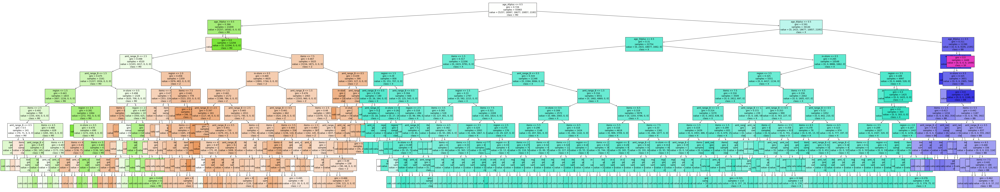

In [85]:
fig = plt.figure(figsize=(100,20))
tree = plot_tree(dtFit14, feature_names=X.columns, class_names = ['Z', 'Mil', 'X', 'BB', 'Sil'], filled=True, fontsize=12)

#### While this makes for a great looking model, now that I've done it I realize I'm essentially using age as a variable to predict age, which is useless. Could these new values be used to help predict a different target?

In [86]:
X = data_bin.iloc[:, [0,1,3,4,5,6,7,8,9]]     # 'in-store', 'items', 'region', 'age_30plus', 'age_40plus', 
# 'age_50plus', 'age_60plus', 'age_70plus', 'age_80plus'
y = data_bin['amt_range_B']
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.30, random_state = 2395)

In [87]:
# The three algorithms have consistently given us very similar results for the most part. Let's move forward with using
# the RandomForestClassifier. It may not be quite as strong as GradientBoost, but it takes significantly less time to run
# and the difference in results is negligible for our purposes.
rfFit15 = rf10.fit(X_train, y_train)
rfPred15 = rfFit15.predict(X_test)
print(classification_report(y_test, rfPred15, target_names=['Under $300', '$300-$600', '$600-$1200', 'Over $1200'], 
                            zero_division=0))

              precision    recall  f1-score   support

  Under $300       0.59      0.56      0.58      6361
   $300-$600       0.31      0.03      0.05      5931
  $600-$1200       0.39      0.52      0.44      5613
  Over $1200       0.53      0.86      0.65      6088

    accuracy                           0.49     23993
   macro avg       0.45      0.49      0.43     23993
weighted avg       0.46      0.49      0.44     23993



The new age classifications don't do anything to help predicting other variables, either. This is exactly the result I got when I used 'age_balgrp' in place of the binary age categories. Perhaps a single binary variable to represent age could be helpful. We will be comparing the spending habits of "older" and "younger" customers, so let's define the cutoff as 30 years old.

In [88]:
X = data.iloc[:, [0,2,3,4]]     # 'in-store', 'items', 'amount', 'region'
y = data['age_30plus']
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.30, random_state = 2395)

In [89]:
rfFit16 = rf10.fit(X_train, y_train)
rfPred16 = rfFit16.predict(X_test)
print(classification_report(y_test, rfPred16, target_names=['Under 30', '30 Plus'], zero_division=0))

              precision    recall  f1-score   support

    Under 30       0.38      0.00      0.00      4091
     30 Plus       0.83      1.00      0.91     19902

    accuracy                           0.83     23993
   macro avg       0.61      0.50      0.46     23993
weighted avg       0.75      0.83      0.75     23993



In [90]:
cv_func(X, y)

DTC 0.8255851711204469
RFC 0.8289861925220223
GBC 0.8225717667856066


We get a model with an overall accuracy of `83%`. While its reliability for predicting someone is under 30 is poor, it is pretty accurate at predicting when someone is over 30. We don't know exactly what Blackwell defines as "younger", so let's explore another cutoff point -- 40 years old.

In [91]:
X = data.iloc[:, [0,2,3,4]]     # 'in-store', 'items', 'amount', 'region'
y = data['age_40plus']
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.30, random_state = 2395)

In [92]:
rfFit28 = rf10.fit(X_train, y_train)
rfPred28 = rfFit28.predict(X_test)
print(classification_report(y_test, rfPred28, target_names=['Under 40', '40 Plus'], zero_division=0))

              precision    recall  f1-score   support

    Under 40       0.55      0.40      0.46      9354
     40 Plus       0.67      0.79      0.73     14639

    accuracy                           0.64     23993
   macro avg       0.61      0.59      0.59     23993
weighted avg       0.63      0.64      0.62     23993



This model correctly predicts whether a person is over/under 40 `64%` of the time. While it's not as reliable as our over/under 30 model, used in conjunction it can help give us a fuller picture of the customer's demographic profile.

## Analyzing Demographics by Region

In the prompt, the question is asked: 

Are there differences in the age of customers between regions? If so, can we predict the age of a customer in a region based on other demographic data?

Let us break the data down by region and take a look.

In [93]:
pt_avg_age_by_reg = data.pivot_table(index = 'region', values = 'age', aggfunc = ['mean'])
print("Average Age by Region")
pt_avg_age_by_reg

Average Age by Region


,mean
,age
region,
1,43.704132
2,56.608624
3,45.646944
4,38.752424


We are able to see clearly that the different regions vary significantly in average age. So can we predict a customer's age in a region based off their purchasing habits?

### Breaking the Data Down Into Regional Sets

In [94]:
cols = ['in-store', 'age_30plus', 'age_40plus', 'items', 'amount']
north = data[data.region == 1]
north = north[cols]
north.index.name = "index_data"
north = north.reset_index(drop = True)
north.head()

,in-store,age_30plus,age_40plus,items,amount
0,1,1,0,4,1937.50
1,1,1,1,5,908.31
2,1,1,1,3,767.54
3,1,1,0,2,684.32
4,1,0,0,7,1901.30


In [95]:
south = data[data.region == 2]
south = south[cols]
south.index.name = "index_data"
south = south.reset_index(drop = True)
south.head()

,in-store,age_30plus,age_40plus,items,amount
0,0,1,0,4,281.03
1,0,1,0,2,219.51
2,0,1,1,6,8.55
3,0,1,0,2,59.00
4,0,1,1,5,114.49


In [96]:
east = data[data.region == 3]
east = east[cols]
east.index.name = "index_data"
east = east.reset_index(drop = True)
east.head()

,in-store,age_30plus,age_40plus,items,amount
0,1,1,1,3,715.25
1,1,1,1,5,819.98
2,1,1,1,5,122.39
3,1,1,1,7,529.57
4,0,1,1,7,1585.10


In [97]:
west = data[data.region == 4]
west = west[cols]
west.index.name = "index_data"
west = west.reset_index(drop = True)
west.head()

,in-store,age_30plus,age_40plus,items,amount
0,1,1,1,3,1525.70
1,0,0,0,3,1314.20
2,1,1,0,6,270.49
3,0,1,0,2,2791.60
4,0,1,1,7,1225.80


### Regional Models to Predict a Customer's Age Range

#### North Region

In [98]:
X = north.iloc[:, [0,3,4]]     # 'in-store', 'items', 'amount'
y = north['age_30plus']
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.30, random_state = 2395)

In [99]:
rfFit17 = rf10.fit(X_train, y_train)
rfPred17 = rfFit17.predict(X_test)
print(classification_report(y_test, rfPred17, target_names=['Under 30', '30 Plus'], zero_division=0))

              precision    recall  f1-score   support

    Under 30       0.25      0.01      0.03       908
     30 Plus       0.81      0.99      0.89      3892

    accuracy                           0.81      4800
   macro avg       0.53      0.50      0.46      4800
weighted avg       0.71      0.81      0.73      4800



In [100]:
X = north.iloc[:, [0,3,4]]     # 'in-store', 'items', 'amount'
y = north['age_40plus']
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.30, random_state = 2395)

In [101]:
rfFit29 = rf10.fit(X_train, y_train)
rfPred29 = rfFit29.predict(X_test)
print(classification_report(y_test, rfPred29, target_names=['Under 40', '40 Plus'], zero_division=0))

              precision    recall  f1-score   support

    Under 40       0.57      0.28      0.38      2049
     40 Plus       0.61      0.84      0.71      2751

    accuracy                           0.60      4800
   macro avg       0.59      0.56      0.54      4800
weighted avg       0.59      0.60      0.57      4800



#### South Region

In [102]:
X = south.iloc[:, [0,3,4]]     # 'in-store', 'items', 'amount'
y = south['age_30plus']
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.30, random_state = 2395)

In [103]:
rfFit18 = rf10.fit(X_train, y_train)
rfPred18 = rfFit18.predict(X_test)
print(classification_report(y_test, rfPred18, target_names=['Under 30', '30 Plus'], zero_division=0))

              precision    recall  f1-score   support

    Under 30       0.00      0.00      0.00       173
     30 Plus       0.97      1.00      0.99      5825

    accuracy                           0.97      5998
   macro avg       0.49      0.50      0.49      5998
weighted avg       0.94      0.97      0.96      5998



In [104]:
X = south.iloc[:, [0,3,4]]     # 'in-store', 'items', 'amount'
y = south['age_40plus']
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.30, random_state = 2395)

In [105]:
rfFit30 = rf10.fit(X_train, y_train)
rfPred30 = rfFit30.predict(X_test)
print(classification_report(y_test, rfPred30, target_names=['Under 40', '40 Plus'], zero_division=0))

              precision    recall  f1-score   support

    Under 40       0.00      0.00      0.00      1242
     40 Plus       0.79      1.00      0.88      4756

    accuracy                           0.79      5998
   macro avg       0.40      0.50      0.44      5998
weighted avg       0.63      0.79      0.70      5998



#### East Region

In [106]:
X = east.iloc[:, [0,3,4]]     # 'in-store', 'items', 'amount'
y = east['age_30plus']
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.30, random_state = 2395)

In [107]:
rfFit19 = rf10.fit(X_train, y_train)
rfPred19 = rfFit19.predict(X_test)
print(classification_report(y_test, rfPred19, target_names=['Under 30', '30 Plus'], zero_division=0))

              precision    recall  f1-score   support

    Under 30       0.15      0.00      0.00       904
     30 Plus       0.83      1.00      0.91      4496

    accuracy                           0.83      5400
   macro avg       0.49      0.50      0.46      5400
weighted avg       0.72      0.83      0.76      5400



In [108]:
X = east.iloc[:, [0,3,4]]     # 'in-store', 'items', 'amount'
y = east['age_40plus']
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.30, random_state = 2395)

In [109]:
rfFit31 = rf10.fit(X_train, y_train)
rfPred31 = rfFit31.predict(X_test)
print(classification_report(y_test, rfPred31, target_names=['Under 40', '40 Plus'], zero_division=0))

              precision    recall  f1-score   support

    Under 40       0.52      0.17      0.26      2032
     40 Plus       0.64      0.91      0.75      3368

    accuracy                           0.63      5400
   macro avg       0.58      0.54      0.51      5400
weighted avg       0.60      0.63      0.57      5400



#### West Region

In [110]:
X = west.iloc[:, [0,3,4]]     # 'in-store', 'items', 'amount' 
y = west['age_30plus']
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.30, random_state = 2395)

In [111]:
rfFit20 = rf10.fit(X_train, y_train)
rfPred20 = rfFit20.predict(X_test)
print(classification_report(y_test, rfPred20, target_names=['Under 30', '30 Plus'], zero_division=0))

              precision    recall  f1-score   support

    Under 30       0.29      0.00      0.00      2116
     30 Plus       0.73      1.00      0.84      5681

    accuracy                           0.73      7797
   macro avg       0.51      0.50      0.42      7797
weighted avg       0.61      0.73      0.61      7797



In [112]:
X = west.iloc[:, [0,3,4]]     # 'in-store', 'items', 'amount' 
y = west['age_40plus']
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.30, random_state = 2395)

In [113]:
rfFit32 = rf10.fit(X_train, y_train)
rfPred32 = rfFit32.predict(X_test)
print(classification_report(y_test, rfPred32, target_names=['Under 40', '40 Plus'], zero_division=0))

              precision    recall  f1-score   support

    Under 40       0.54      0.65      0.59      4061
     40 Plus       0.52      0.40      0.45      3736

    accuracy                           0.53      7797
   macro avg       0.53      0.53      0.52      7797
weighted avg       0.53      0.53      0.53      7797



#### Full Dataset

In [114]:
# Compare each region to the full dataset
X = data.iloc[:, [0,2,3,4]]     # 'in-store', 'items', 'amount', 'region'
y = data['age_30plus']
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.30, random_state = 2395)

In [115]:
rfFit21 = rf10.fit(X_train, y_train)
rfPred21 = rfFit21.predict(X_test)
print(classification_report(y_test, rfPred21, target_names=['Under 30', '30 Plus'], zero_division=0))

              precision    recall  f1-score   support

    Under 30       0.36      0.00      0.00      4091
     30 Plus       0.83      1.00      0.91     19902

    accuracy                           0.83     23993
   macro avg       0.59      0.50      0.46     23993
weighted avg       0.75      0.83      0.75     23993



In [116]:
X = data.iloc[:, [0,2,3,4]]     # 'in-store', 'items', 'amount', 'region'
y = data['age_40plus']
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.30, random_state = 2395)

In [117]:
rfFit33 = rf10.fit(X_train, y_train)
rfPred33 = rfFit33.predict(X_test)
print(classification_report(y_test, rfPred33, target_names=['Under 40', '40 Plus'], zero_division=0))

              precision    recall  f1-score   support

    Under 40       0.55      0.40      0.46      9354
     40 Plus       0.67      0.79      0.73     14639

    accuracy                           0.64     23993
   macro avg       0.61      0.60      0.60     23993
weighted avg       0.62      0.64      0.62     23993



Using these models which analyze purchase location, total number of items, and amount spent, we are able to correctly predict whether a customer is over 30 `83%` of the time regardless of region, and whether they are over 40 `64%` of the time. That success rate varies when broken down regionally, with the West having the lowest rates of `73%` and `54%`. This is explained by the larger percentage of "young" customers (those under 30) in this region and a sharp dropoff in customers over age 62. The South has exceedingly high accuracy rates of `97%` and `79%` due to a dearth of under-30 year olds.

## Investigating the Relationship Between 'age' and 'in-store'

The other question asked in the prompt is:

Is there any correlation between age of a customer and if the transaction was made online or in the store? Do any other factors predict if a customer will buy online or in our stores?

In [118]:
# Let's examine the correlation of 'in-store' to 'age' using our 'age_gen' variable
X = data.iloc[:, [0]]     #'in-store'
y = data['age_gen']
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.30, random_state = 2395)

In [119]:
rfFit22 = rf10.fit(X_train, y_train)
rfPred22 = rfFit22.predict(X_test)
print(classification_report(y_test, rfPred22, target_names=['Gen Z', 'Millenial', 'Gen X', 'Boomer', 'Silent Gen'], 
                            zero_division=0))

              precision    recall  f1-score   support

       Gen Z       0.00      0.00      0.00      2248
   Millenial       0.38      0.57      0.46      8136
       Gen X       0.32      0.48      0.39      8006
      Boomer       0.00      0.00      0.00      4709
  Silent Gen       0.00      0.00      0.00       894

    accuracy                           0.35     23993
   macro avg       0.14      0.21      0.17     23993
weighted avg       0.24      0.35      0.28     23993



In [120]:
# Can whether a customer is over 30 be successfully predicted with only their 'in-store' status?
X = data.iloc[:, [0]]     # 'in-store'
y = data['age_30plus']
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.30, random_state = 2395)

In [121]:
rfFit23 = rf10.fit(X_train, y_train)
rfPred23 = rfFit23.predict(X_test)
print(classification_report(y_test, rfPred23, target_names=['Under 30', '30 Plus'], zero_division=0))

              precision    recall  f1-score   support

    Under 30       0.00      0.00      0.00      4091
     30 Plus       0.83      1.00      0.91     19902

    accuracy                           0.83     23993
   macro avg       0.41      0.50      0.45     23993
weighted avg       0.69      0.83      0.75     23993



In [122]:
# How about over 40?
X = data.iloc[:, [0]]     # 'in-store'
y = data['age_40plus']
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.30, random_state = 2395)

In [123]:
rfFit34 = rf10.fit(X_train, y_train)
rfPred34 = rfFit34.predict(X_test)
print(classification_report(y_test, rfPred34, target_names=['Under 40', '40 Plus'], zero_division=0))

              precision    recall  f1-score   support

    Under 40       0.00      0.00      0.00      9354
     40 Plus       0.61      1.00      0.76     14639

    accuracy                           0.61     23993
   macro avg       0.31      0.50      0.38     23993
weighted avg       0.37      0.61      0.46     23993



`in-store` is a strong predictor of `age`.

In [124]:
# Can whether a purchase was made online be predicted solely with the knowledge of whether the customer is over 30? Over 40?
X = data.iloc[:, [11]]     # 'age_30plus'
y = data['in-store']
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.30, random_state = 2395)

In [125]:
rfFit24 = rf10.fit(X_train, y_train)
rfPred24 = rfFit24.predict(X_test)
print(classification_report(y_test, rfPred24, target_names=['In Store', 'Online'], zero_division=0))

              precision    recall  f1-score   support

    In Store       0.52      0.86      0.65     11950
      Online       0.60      0.20      0.30     12043

    accuracy                           0.53     23993
   macro avg       0.56      0.53      0.48     23993
weighted avg       0.56      0.53      0.47     23993



In [126]:
X = data.iloc[:, [12]]     # 'age_40plus'
y = data['in-store']
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.30, random_state = 2395)

In [127]:
rfFit35 = rf10.fit(X_train, y_train)
rfPred35 = rfFit35.predict(X_test)
print(classification_report(y_test, rfPred35, target_names=['In Store', 'Online'], zero_division=0))

              precision    recall  f1-score   support

    In Store       0.54      0.66      0.60     11950
      Online       0.57      0.44      0.50     12043

    accuracy                           0.55     23993
   macro avg       0.56      0.55      0.55     23993
weighted avg       0.56      0.55      0.55     23993



`age` is not a strong predictor of `in-store`. It's essentially a coin flip. 

In [128]:
# Does a customer's region help inform their 'in-store' status?
X = data.iloc[:, [4, 11]]     # 'region' and 'age_30plus'
y = data['in-store']
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.30, random_state = 2395)

In [129]:
rfFit25 = rf10.fit(X_train, y_train)
rfPred25 = rfFit25.predict(X_test)
print(classification_report(y_test, rfPred25, target_names=['In Store', 'Online'], zero_division=0))

              precision    recall  f1-score   support

    In Store       0.75      0.79      0.77     11950
      Online       0.78      0.74      0.76     12043

    accuracy                           0.77     23993
   macro avg       0.77      0.77      0.77     23993
weighted avg       0.77      0.77      0.77     23993



In [130]:
X = data.iloc[:, [4, 12]]     # 'region' and 'age_40plus'
y = data['in-store']
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.30, random_state = 2395)

In [131]:
rfFit36 = rf10.fit(X_train, y_train)
rfPred36 = rfFit36.predict(X_test)
print(classification_report(y_test, rfPred36, target_names=['In Store', 'Online'], zero_division=0))

              precision    recall  f1-score   support

    In Store       0.77      0.76      0.77     11950
      Online       0.76      0.78      0.77     12043

    accuracy                           0.77     23993
   macro avg       0.77      0.77      0.77     23993
weighted avg       0.77      0.77      0.77     23993



`region` has a strong effect on the ability to predict `in-store`.

In [132]:
# Does knowing the number of items purchased inform the 'in-store' status?
X = data.iloc[:, [2, 4, 11]]     # 'items', 'region' and 'age_30plus'
y = data['in-store']
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.30, random_state = 2395)

In [133]:
rfFit26 = rf10.fit(X_train, y_train)
rfPred26 = rfFit26.predict(X_test)
print(classification_report(y_test, rfPred26, target_names=['In Store', 'Online'], zero_division=0))

              precision    recall  f1-score   support

    In Store       0.77      0.76      0.76     11950
      Online       0.76      0.77      0.77     12043

    accuracy                           0.76     23993
   macro avg       0.76      0.76      0.76     23993
weighted avg       0.76      0.76      0.76     23993



`items` contributes nothing to the model's ability to accurately predict `in-store`.

In [134]:
# Does the purchase amount inform the 'in-store' status?
X = data.iloc[:, [3, 4, 11]]     # 'amount', 'region' and 'age_30plus'
y = data['in-store']
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.30, random_state = 2395)

In [135]:
rfFit27 = rf10.fit(X_train, y_train)
rfPred27 = rfFit27.predict(X_test)
print(classification_report(y_test, rfPred27, target_names=['In Store', 'Online'], zero_division=0))

              precision    recall  f1-score   support

    In Store       1.00      0.73      0.84     11950
      Online       0.79      1.00      0.88     12043

    accuracy                           0.86     23993
   macro avg       0.89      0.86      0.86     23993
weighted avg       0.89      0.86      0.86     23993



In [136]:
X = data.iloc[:, [3, 4, 12]]     # 'amount', 'region' and 'age_40plus'
y = data['in-store']
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.30, random_state = 2395)

In [137]:
rfFit37 = rf10.fit(X_train, y_train)
rfPred37 = rfFit37.predict(X_test)
print(classification_report(y_test, rfPred37, target_names=['In Store', 'Online'], zero_division=0))

              precision    recall  f1-score   support

    In Store       1.00      0.73      0.84     11950
      Online       0.79      1.00      0.88     12043

    accuracy                           0.86     23993
   macro avg       0.89      0.86      0.86     23993
weighted avg       0.89      0.86      0.86     23993



`amount` strengthens the model's predictive ability. Is `age` even a necessary feature?

In [138]:
X = data.iloc[:, [3, 4]]     # 'amount', 'region'
y = data['in-store']
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.30, random_state = 2395)

In [139]:
rfFit38 = rf10.fit(X_train, y_train)
rfPred38 = rfFit38.predict(X_test)
print(classification_report(y_test, rfPred38, target_names=['In Store', 'Online'], zero_division=0))

              precision    recall  f1-score   support

    In Store       1.00      0.73      0.84     11950
      Online       0.79      1.00      0.88     12043

    accuracy                           0.86     23993
   macro avg       0.89      0.86      0.86     23993
weighted avg       0.89      0.86      0.86     23993



In [140]:
X = data.iloc[:, [4]]     # 'region'
y = data['in-store']
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.30, random_state = 2395)

In [141]:
rfFit39 = rf10.fit(X_train, y_train)
rfPred39 = rfFit39.predict(X_test)
print(classification_report(y_test, rfPred39, target_names=['In Store', 'Online'], zero_division=0))

              precision    recall  f1-score   support

    In Store       0.72      0.83      0.77     11950
      Online       0.80      0.67      0.73     12043

    accuracy                           0.75     23993
   macro avg       0.76      0.75      0.75     23993
weighted avg       0.76      0.75      0.75     23993



When `amount` and `region` are included as features, the model's result is practically identical with or without `age` included. When there are only two features, `age` does appear to strengthen the model, though not by a large margin. While `in-store` is a strong predictive feature to deduce `age`, the relationship is not reciprocal.

In [150]:
X = data.iloc[:, [0,2,3,4]]     # 'in-store', 'items', 'amount', 'region'
y = data['age_40plus']
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.30, random_state = 2395)

In [152]:
dtFit23 = dt10.fit(X_train, y_train)
dtPred23 = dtFit23.predict(X_test)
print(classification_report(y_test, dtPred23, target_names=['Under 40', '40 Plus'], zero_division=0))

              precision    recall  f1-score   support

    Under 40       0.56      0.34      0.42      9354
     40 Plus       0.66      0.83      0.74     14639

    accuracy                           0.64     23993
   macro avg       0.61      0.59      0.58     23993
weighted avg       0.62      0.64      0.62     23993



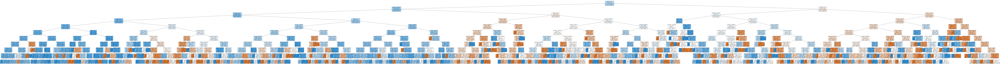

In [155]:
fig = plt.figure(figsize=(300,20))
tree = plot_tree(dtFit23, feature_names=X.columns, class_names = ['Under 40', '40 Plus'], filled=True, fontsize=12)

This decision tree illustrates that `region` is the most important variable in determining `age`.

In [157]:
X = data.iloc[:, [3, 4, 12]]     # 'amount', 'region' and 'age_40plus'
y = data['in-store']
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=.30, random_state = 2395)

In [158]:
dtFit37 = dt10.fit(X_train, y_train)
dtPred37 = dtFit37.predict(X_test)
print(classification_report(y_test, dtPred37, target_names=['In Store', 'Online'], zero_division=0))

              precision    recall  f1-score   support

    In Store       0.98      0.74      0.84     11950
      Online       0.79      0.98      0.88     12043

    accuracy                           0.86     23993
   macro avg       0.89      0.86      0.86     23993
weighted avg       0.88      0.86      0.86     23993



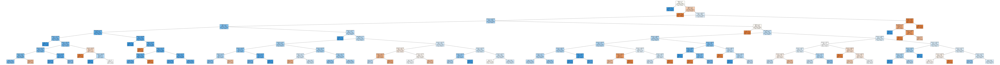

In [159]:
fig = plt.figure(figsize=(300,20))
tree = plot_tree(dtFit37, feature_names=X.columns, class_names = ['In Store', 'Online'], filled=True, fontsize=12)

This decision tree illustrates that `region` is the most important variable in determining `in-store`.